# 2D CNN Sferics Localization

Interactive training notebook for the reviewed localization subset. The model learns `spec_db -> target_heatmap`, then reports heatmap loss and a simple peak-picking preview for event times/count.

In [21]:
from pathlib import Path
from types import SimpleNamespace
import importlib.util
import json
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

PROJECT_ROOT = Path.cwd()
for candidate in [PROJECT_ROOT, *PROJECT_ROOT.parents]:
    if (candidate / "dataset_localization" / "metadata.csv").exists():
        PROJECT_ROOT = candidate
        break

METHOD_DIR = PROJECT_ROOT / "methods" / "2d_cnn_localization"
DATASET_DIR = PROJECT_ROOT / "dataset_localization"
MODULE_PATH = METHOD_DIR / "train_sferics_localization_2d.py"

spec = importlib.util.spec_from_file_location("train_sferics_localization_2d", MODULE_PATH)
loc = importlib.util.module_from_spec(spec)
spec.loader.exec_module(loc)

DATASET_DIR, METHOD_DIR

(PosixPath('/home/s_grudinin/code/university/vlf_analyzing/worktrees/2d_localization/dataset_localization'),
 PosixPath('/home/s_grudinin/code/university/vlf_analyzing/worktrees/2d_localization/methods/2d_cnn_localization'))

## Reviewed Split Summary

In [22]:
metadata = pd.DataFrame(loc.load_reviewed_metadata(DATASET_DIR))
print(f"reviewed rows: {len(metadata)}")
display(metadata.groupby(["split", "channel", "label_source"]).size().rename("count").reset_index())
display(metadata.groupby("split").size().rename("count"))

reviewed rows: 560


,split,channel,label_source,count
0,test,ns,manual_corrected,50
1,test,ns,manual_verified,8
2,test,we,manual_corrected,6
3,test,we,manual_verified,11
4,train,ns,manual_corrected,155
5,train,ns,manual_verified,36
6,train,we,manual_corrected,88
7,train,we,manual_verified,136
8,val,ns,manual_corrected,27
9,val,ns,manual_verified,4


split
test      75
train    415
val       70
Name: count, dtype: int64

## Inspect One Training Sample

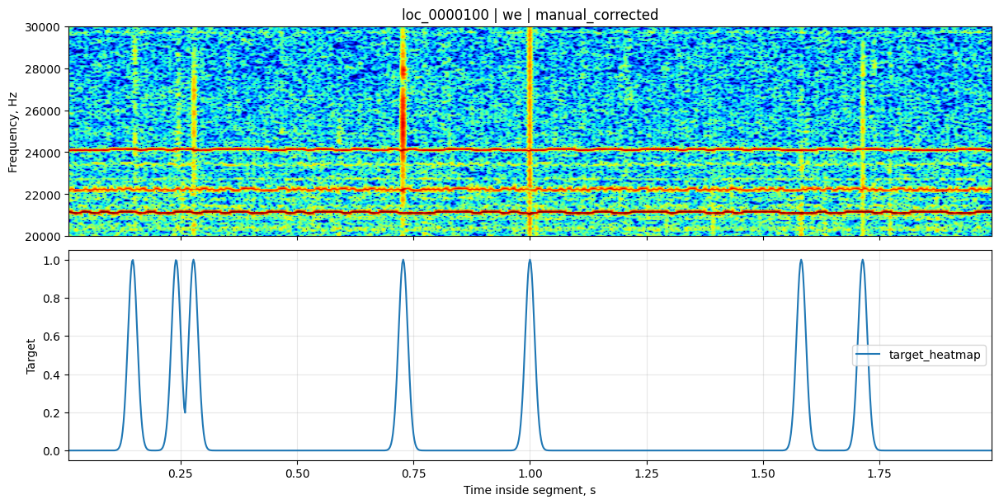

sample_id                                                   loc_0000100
split                                                             train
event_count                                                           7
event_times_s_json    [0.14740300178527832, 0.24071599543094635, 0.2...
npz_path                                        samples/loc_0000100.npz
Name: 36, dtype: object

In [23]:
sample_row = metadata[metadata["split"] == "train"].iloc[0]
sample_npz = DATASET_DIR / str(sample_row["npz_path"]).replace("\\\\", "/")
data = np.load(sample_npz)

spec_db = data["spec_db"].astype(np.float32)
target_heatmap = data["target_heatmap"].astype(np.float32)
time_axis = data["time_axis"].astype(np.float32)
freq_axis = data["freq_axis"].astype(np.float32)

fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True, constrained_layout=True)
vmin, vmax = np.percentile(spec_db, [2, 99.8])
axes[0].imshow(
    spec_db,
    origin="lower",
    aspect="auto",
    extent=(time_axis[0], time_axis[-1], freq_axis[0], freq_axis[-1]),
    vmin=vmin,
    vmax=vmax,
    cmap="jet",
)
axes[0].set_title(f"{sample_row['sample_id']} | {sample_row['channel']} | {sample_row['label_source']}")
axes[0].set_ylabel("Frequency, Hz")
axes[1].plot(time_axis, target_heatmap, label="target_heatmap")
axes[1].set_xlabel("Time inside segment, s")
axes[1].set_ylabel("Target")
axes[1].grid(alpha=0.3)
axes[1].legend()
plt.show()

sample_row[["sample_id", "split", "event_count", "event_times_s_json", "npz_path"]]

## Train

Start with a small epoch count for a smoke run. Increase `EPOCHS` once the curves and preview plots look sane.

In [25]:
EPOCHS = 15
BATCH_SIZE = 16
LEARNING_RATE = 1e-3
SEED = 42

args = SimpleNamespace(
    dataset_dir=DATASET_DIR,
    output_dir=METHOD_DIR,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    learning_rate=LEARNING_RATE,
    weight_decay=1e-4,
    seed=SEED,
    num_workers=0,
    peak_threshold=0.35,
    min_peak_distance=0.03,
    match_tolerance=0.04,
)

report, val_predictions, test_predictions = loc.train(args)

epoch 01: train_loss=0.048852 train_mae=0.157048 val_loss=0.021734 val_mae=0.083636
epoch 02: train_loss=0.012492 train_mae=0.047397 val_loss=0.015751 val_mae=0.037163
epoch 03: train_loss=0.009336 train_mae=0.038161 val_loss=0.014077 val_mae=0.037397
epoch 04: train_loss=0.008718 train_mae=0.036607 val_loss=0.011396 val_mae=0.055788
epoch 05: train_loss=0.008457 train_mae=0.034907 val_loss=0.011056 val_mae=0.034982
epoch 06: train_loss=0.008302 train_mae=0.034053 val_loss=0.010008 val_mae=0.042957
epoch 07: train_loss=0.007766 train_mae=0.032952 val_loss=0.009519 val_mae=0.037512
epoch 08: train_loss=0.007479 train_mae=0.031456 val_loss=0.009044 val_mae=0.033290
epoch 09: train_loss=0.007219 train_mae=0.030726 val_loss=0.008838 val_mae=0.042581
epoch 10: train_loss=0.007011 train_mae=0.029479 val_loss=0.010002 val_mae=0.029044
epoch 11: train_loss=0.006899 train_mae=0.029126 val_loss=0.008696 val_mae=0.029020
epoch 12: train_loss=0.007051 train_mae=0.029013 val_loss=0.008534 val_mae=0

## Loss Curves

,epoch,train_loss,train_mae,val_loss,val_mae
0,1,0.048852,0.157048,0.021734,0.083636
1,2,0.012492,0.047397,0.015751,0.037163
2,3,0.009336,0.038161,0.014077,0.037397
3,4,0.008718,0.036607,0.011396,0.055788
4,5,0.008457,0.034907,0.011056,0.034982
5,6,0.008302,0.034053,0.010008,0.042957
6,7,0.007766,0.032952,0.009519,0.037512
7,8,0.007479,0.031456,0.009044,0.033290
8,9,0.007219,0.030726,0.008838,0.042581
9,10,0.007011,0.029479,0.010002,0.029044


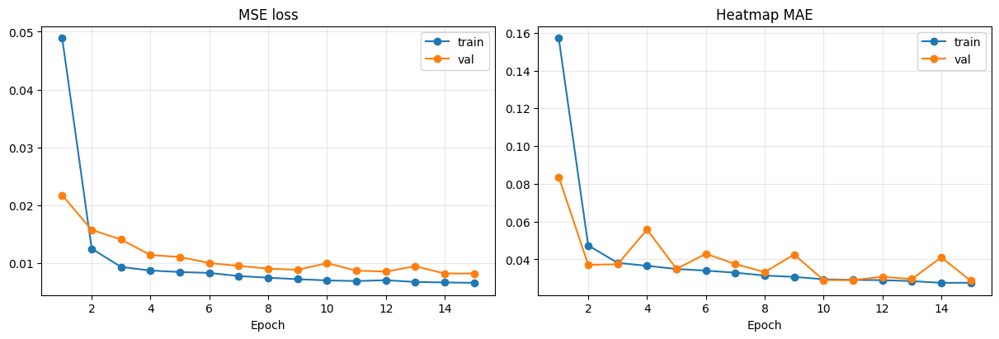

({'heatmap_mse': 0.008199092868848571,
  'heatmap_mae': 0.04108603862779481,
  'event_tp': 310.0,
  'event_fp': 59.0,
  'event_fn': 36.0,
  'event_precision': 0.8401084010840109,
  'event_recall': 0.8959537572254336,
  'event_f1': 0.8671328671328672,
  'event_count_mae': 0.8428571428571429},
 {'heatmap_mse': 0.009893976496532559,
  'heatmap_mae': 0.04891639885803064,
  'event_tp': 281.0,
  'event_fp': 127.0,
  'event_fn': 32.0,
  'event_precision': 0.6887254901960784,
  'event_recall': 0.8977635782747604,
  'event_f1': 0.7794729542302358,
  'event_count_mae': 1.64})

In [26]:
history = pd.DataFrame(report["history"])
display(history)

fig, axes = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)
axes[0].plot(history["epoch"], history["train_loss"], marker="o", label="train")
axes[0].plot(history["epoch"], history["val_loss"], marker="o", label="val")
axes[0].set_title("MSE loss")
axes[0].set_xlabel("Epoch")
axes[0].grid(alpha=0.3)
axes[0].legend()

axes[1].plot(history["epoch"], history["train_mae"], marker="o", label="train")
axes[1].plot(history["epoch"], history["val_mae"], marker="o", label="val")
axes[1].set_title("Heatmap MAE")
axes[1].set_xlabel("Epoch")
axes[1].grid(alpha=0.3)
axes[1].legend()
plt.show()

report["val"], report["test"]

## Test Predictions Preview

In [27]:
test_df = pd.DataFrame(test_predictions).sort_values("heatmap_mse", ascending=False)
print("Event-level metrics, tolerance =", report["match_tolerance"], "s")
display(pd.DataFrame([report["val"], report["test"]], index=["val", "test"])[[
    "event_precision",
    "event_recall",
    "event_f1",
    "event_count_mae",
    "heatmap_mse",
    "heatmap_mae",
]])

display(test_df.head(10)[[
    "sample_id",
    "channel",
    "event_count",
    "predicted_event_count",
    "event_tp",
    "event_fp",
    "event_fn",
    "heatmap_mse",
    "event_times_s_json",
    "predicted_event_times_s_json",
]])

Event-level metrics, tolerance = 0.04 s


,event_precision,event_recall,event_f1,event_count_mae,heatmap_mse,heatmap_mae
val,0.840108,0.895954,0.867133,0.842857,0.008199,0.041086
test,0.688725,0.897764,0.779473,1.640000,0.009894,0.048916


,sample_id,channel,event_count,predicted_event_count,event_tp,event_fp,event_fn,heatmap_mse,event_times_s_json,predicted_event_times_s_json
39,loc_0003551,ns,12,12,10,2,2,0.026700,"[0.21199999749660492, 0.2601560056209564, 0.63...","[0.21199999749660492, 0.257999986410141, 0.579..."
23,loc_0002189,ns,9,8,6,2,3,0.026177,"[0.49000000953674316, 0.5740000009536743, 0.63...","[0.4880000054836273, 0.5720000267028809, 0.603..."
19,loc_0002185,ns,4,3,2,1,2,0.023959,"[0.03465000167489052, 0.07741899788379669, 0.4...","[0.5059999823570251, 1.0080000162124634, 1.253..."
55,loc_0003567,ns,8,8,7,1,1,0.021889,"[0.26404398679733276, 0.3319999873638153, 0.55...","[0.25999999046325684, 0.3319999873638153, 0.39..."
58,loc_0003858,ns,10,13,10,3,0,0.019002,"[0.906000018119812, 1.0080000162124634, 1.3040...","[0.8700000047683716, 0.906000018119812, 0.9620..."
2,loc_0000815,we,6,4,4,0,2,0.017841,"[0.03999999910593033, 0.4959999918937683, 0.86...","[0.035999998450279236, 0.49399998784065247, 0...."
71,loc_0005705,ns,6,8,5,3,1,0.017497,"[0.06199999898672104, 0.5619999766349792, 0.82...","[0.06199999898672104, 0.5619999766349792, 0.82..."
51,loc_0003563,ns,5,6,4,2,1,0.017264,"[0.3499999940395355, 0.7919999957084656, 0.913...","[0.2879999876022339, 0.3479999899864197, 0.381..."
6,loc_0002104,ns,0,6,0,6,0,0.016387,[],"[0.35199999809265137, 0.40400001406669617, 0.9..."
10,loc_0002169,ns,9,10,8,2,1,0.016115,"[0.04631499946117401, 0.07741899788379669, 0.1...","[0.041999999433755875, 0.1420000046491623, 0.1..."


## Plot Worst Heatmap Examples

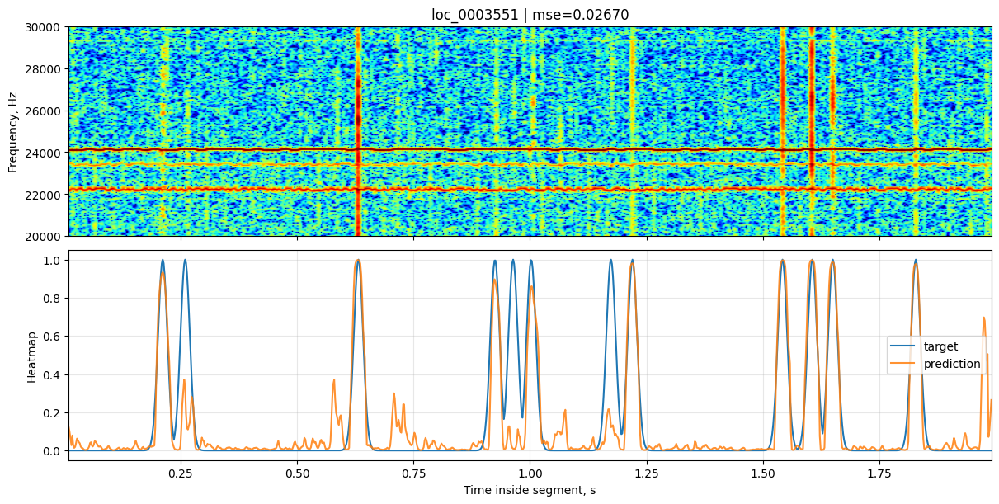

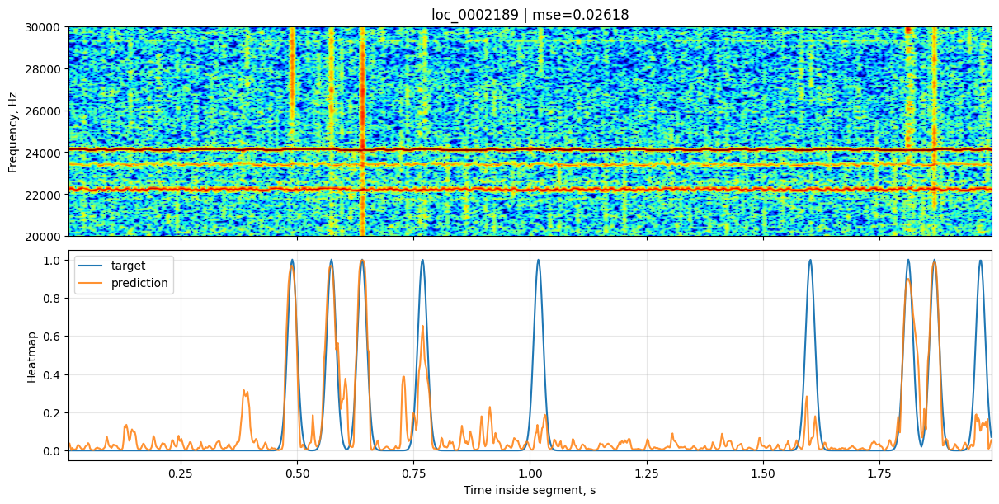

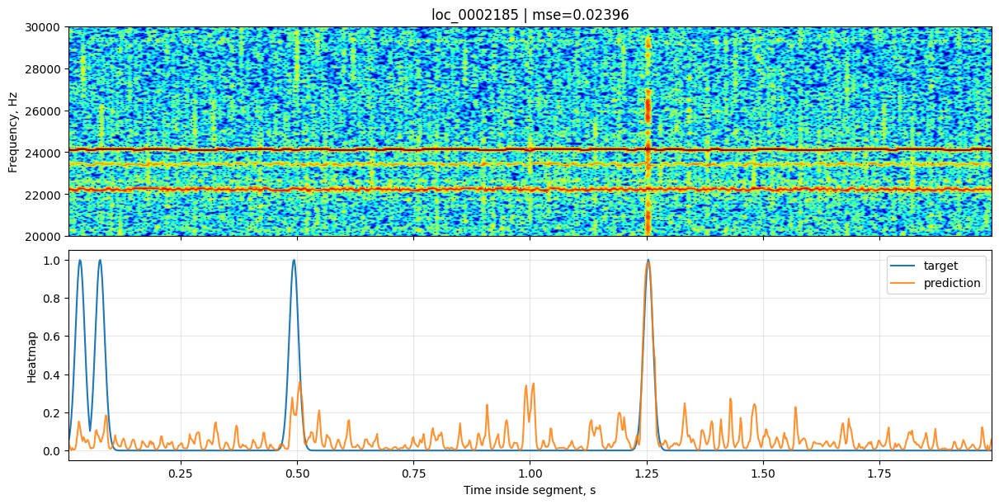

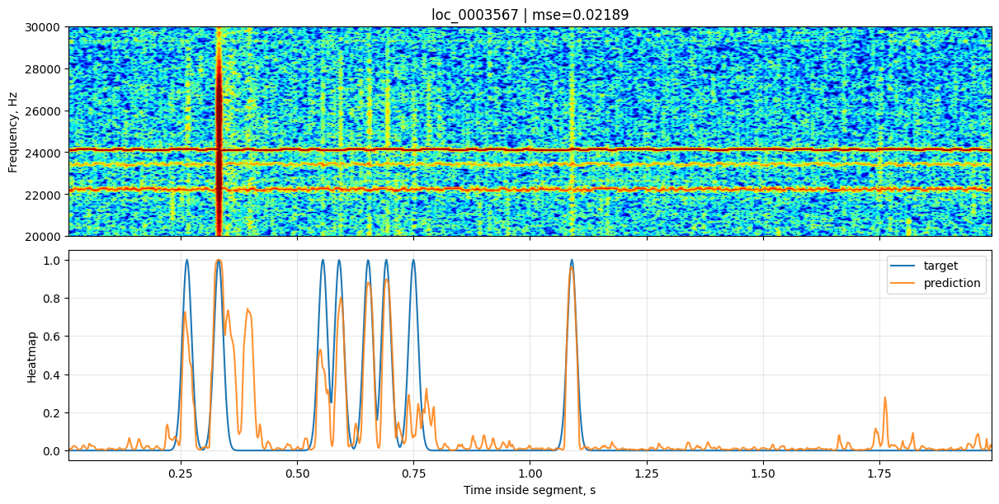

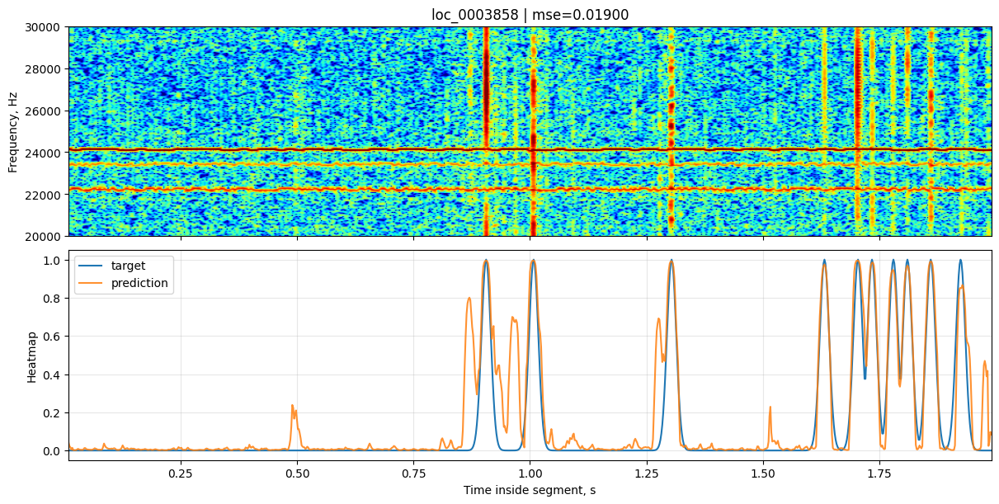

In [28]:
import torch

torch_mod, _, _, _, Model = loc.build_torch_components()
device = torch_mod.device("cuda" if torch_mod.cuda.is_available() else "cpu")
checkpoint = torch_mod.load(METHOD_DIR / "models" / "sferics_localization_2d.pt", map_location=device)
model = Model().to(device)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

def plot_prediction(row):
    npz_path = DATASET_DIR / str(row["npz_path"]).replace("\\\\", "/")
    data = np.load(npz_path)
    spec = loc.normalize_spec(data["spec_db"])
    target = data["target_heatmap"].astype(np.float32)
    time_axis = data["time_axis"].astype(np.float32)
    freq_axis = data["freq_axis"].astype(np.float32)
    with torch_mod.no_grad():
        pred = model(torch_mod.from_numpy(spec[None, None, :, :]).to(device)).cpu().numpy()[0]

    fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True, constrained_layout=True)
    raw_spec = data["spec_db"].astype(np.float32)
    vmin, vmax = np.percentile(raw_spec, [2, 99.8])
    axes[0].imshow(
        raw_spec,
        origin="lower",
        aspect="auto",
        extent=(time_axis[0], time_axis[-1], freq_axis[0], freq_axis[-1]),
        vmin=vmin,
        vmax=vmax,
        cmap="jet",
    )
    axes[0].set_title(f"{row['sample_id']} | mse={row['heatmap_mse']:.5f}")
    axes[0].set_ylabel("Frequency, Hz")
    axes[1].plot(time_axis, target, label="target")
    axes[1].plot(time_axis, pred, label="prediction", alpha=0.85)
    axes[1].set_xlabel("Time inside segment, s")
    axes[1].set_ylabel("Heatmap")
    axes[1].grid(alpha=0.3)
    axes[1].legend()
    plt.show()

for _, row in test_df.head(5).iterrows():
    plot_prediction(row)

## Saved Model Checkpoint

The training cell saves the best validation checkpoint to `models/sferics_localization_2d.pt`. Run this block to reload that saved model without retraining.


In [29]:
import torch

MODEL_PATH = METHOD_DIR / "models" / "sferics_localization_2d.pt"
if not MODEL_PATH.exists():
    raise FileNotFoundError(f"Train the model first; checkpoint not found: {MODEL_PATH}")

torch_mod, _, _, _, Model = loc.build_torch_components()
device = torch_mod.device("cuda" if torch_mod.cuda.is_available() else "cpu")
checkpoint = torch_mod.load(MODEL_PATH, map_location=device)
model = Model().to(device)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

print("loaded model:", MODEL_PATH)
print("device:", device)
print("checkpoint keys:", sorted(checkpoint.keys()))


loaded model: /home/s_grudinin/code/university/vlf_analyzing/worktrees/2d_localization/methods/2d_cnn_localization/models/sferics_localization_2d.pt
device: cpu
checkpoint keys: ['input_key', 'model_kind', 'model_state_dict', 'reviewed_label_sources', 'target_key']


## Run Saved Model On New Raw File

This block cuts the raw Broadband file into the same 2-second, 20-30 kHz spectrogram windows used for training, runs the saved CNN on each channel, and saves a CSV with predicted event times.


In [30]:
import csv
import importlib.util

PLOT_MODULE_PATH = PROJECT_ROOT / "plot_broadband_spectrogram.py"
if not PLOT_MODULE_PATH.exists():
    raise FileNotFoundError(f"plot_broadband_spectrogram.py not found: {PLOT_MODULE_PATH}")

plot_spec = importlib.util.spec_from_file_location("plot_broadband_spectrogram", PLOT_MODULE_PATH)
broadband = importlib.util.module_from_spec(plot_spec)
plot_spec.loader.exec_module(broadband)

RAW_FILE_NAME = "Broadband_Data_2026.06.02_13.51.00.bin"
raw_candidates = [
    candidate / "new_test_raw_data" / RAW_FILE_NAME
    for candidate in [PROJECT_ROOT, *PROJECT_ROOT.parents]
]
RAW_FILE = next((path for path in raw_candidates if path.exists()), None)
if RAW_FILE is None:
    raise FileNotFoundError("Could not find new_test_raw_data/" + RAW_FILE_NAME)

SAMPLE_RATE = 100_000.0
SEGMENT_DURATION = 2.0
FREQ_MIN = 20_000.0
FREQ_MAX = 30_000.0
TIME_RESOLUTION = 0.002
FREQUENCY_RESOLUTION = 50.0
CHANNELS = ["ns", "we"]
INFERENCE_PEAK_THRESHOLD = float(best_val_threshold["threshold"]) if "best_val_threshold" in globals() else float(args.peak_threshold)
INFERENCE_MIN_PEAK_DISTANCE = float(args.min_peak_distance)

record_size, sample_count, data_offset = broadband.read_metadata(RAW_FILE)
samples = broadband.load_samples(RAW_FILE, sample_count, record_size, data_offset)
reports_dir = METHOD_DIR / "reports"
reports_dir.mkdir(parents=True, exist_ok=True)
raw_predictions_path = reports_dir / f"{RAW_FILE.stem}_2d_cnn_predictions.csv"
raw_prediction_rows = []
raw_prediction_cache = {}

for channel in CHANNELS:
    channel_index = broadband.CHANNEL_NAME_TO_INDEX[channel]
    channel_samples = broadband.extract_channel(
        samples=samples,
        sample_count=sample_count,
        record_size=record_size,
        channels=2,
        channel_index=channel_index,
    )
    nperseg, hop = broadband.resolve_stft_parameters(
        samples=channel_samples,
        sample_rate=SAMPLE_RATE,
        nperseg=4096,
        max_frames=4000,
        time_resolution=TIME_RESOLUTION,
        frequency_resolution=FREQUENCY_RESOLUTION,
    )
    freq_min, freq_max = broadband.resolve_frequency_band(SAMPLE_RATE, FREQ_MIN, FREQ_MAX)
    segments = broadband.iter_time_segments(channel_samples, SAMPLE_RATE, SEGMENT_DURATION, nperseg)

    for segment_index, start, stop, start_s, stop_s in segments:
        segment_samples = channel_samples[start:stop]
        spec_db, time_axis_samples, freq_axis = broadband.compute_spectrogram(segment_samples, nperseg=nperseg, hop=hop)
        spec_db, freq_axis = broadband.crop_frequency_band(spec_db, freq_axis, SAMPLE_RATE, freq_min, freq_max)
        time_axis_s = time_axis_samples / SAMPLE_RATE
        freq_axis_hz = freq_axis * SAMPLE_RATE
        normalized = loc.normalize_spec(spec_db)

        with torch_mod.no_grad():
            prediction = model(torch_mod.from_numpy(normalized[None, None, :, :]).to(device)).cpu().numpy()[0]

        time_step = float(np.median(np.diff(time_axis_s))) if time_axis_s.size > 1 else TIME_RESOLUTION
        min_distance_bins = max(1, int(round(INFERENCE_MIN_PEAK_DISTANCE / time_step)))
        peak_indices = loc.pick_peaks(
            prediction,
            threshold=INFERENCE_PEAK_THRESHOLD,
            min_distance_bins=min_distance_bins,
        )
        predicted_times_inside = [float(time_axis_s[index]) for index in peak_indices]
        predicted_times_absolute = [float(start_s + value) for value in predicted_times_inside]

        row = {
            "source_file": str(RAW_FILE),
            "channel": channel,
            "segment_index": segment_index,
            "segment_start_s": float(start_s),
            "segment_end_s": float(stop_s),
            "peak_threshold": INFERENCE_PEAK_THRESHOLD,
            "predicted_event_count": len(predicted_times_inside),
            "predicted_event_times_inside_s_json": json.dumps(predicted_times_inside),
            "predicted_event_times_absolute_s_json": json.dumps(predicted_times_absolute),
        }
        raw_prediction_rows.append(row)
        raw_prediction_cache[(channel, segment_index)] = {
            "spec_db": spec_db.astype(np.float32),
            "time_axis_s": time_axis_s.astype(np.float32),
            "freq_axis_hz": freq_axis_hz.astype(np.float32),
            "prediction": prediction.astype(np.float32),
            "peaks_inside": predicted_times_inside,
            "segment_start_s": float(start_s),
            "segment_end_s": float(stop_s),
        }

with raw_predictions_path.open("w", newline="", encoding="utf-8") as fh:
    fieldnames = list(raw_prediction_rows[0].keys())
    writer = csv.DictWriter(fh, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(raw_prediction_rows)

raw_predictions_df = pd.DataFrame(raw_prediction_rows)
print("raw file:", RAW_FILE)
print("model:", MODEL_PATH)
print("peak_threshold:", INFERENCE_PEAK_THRESHOLD)
print("predictions:", raw_predictions_path)
display(raw_predictions_df.groupby("channel")["predicted_event_count"].agg(["count", "sum", "mean", "max"]))
display(raw_predictions_df.sort_values("predicted_event_count", ascending=False).head(12))


raw file: /home/s_grudinin/code/university/vlf_analyzing/new_test_raw_data/Broadband_Data_2026.06.02_13.51.00.bin
model: /home/s_grudinin/code/university/vlf_analyzing/worktrees/2d_localization/methods/2d_cnn_localization/models/sferics_localization_2d.pt
peak_threshold: 0.35
predictions: /home/s_grudinin/code/university/vlf_analyzing/worktrees/2d_localization/methods/2d_cnn_localization/reports/Broadband_Data_2026.06.02_13.51.00_2d_cnn_predictions.csv


,count,sum,mean,max
channel,,,,
ns,30,82,2.733333,6
we,30,309,10.300000,17


,source_file,channel,segment_index,segment_start_s,segment_end_s,peak_threshold,predicted_event_count,predicted_event_times_inside_s_json,predicted_event_times_absolute_s_json
42,/home/s_grudinin/code/university/vlf_analyzing...,we,12,24.0,26.0,0.35,17,"[0.03400000184774399, 0.30399999022483826, 0.3...","[24.034000001847744, 24.30399999022484, 24.335..."
58,/home/s_grudinin/code/university/vlf_analyzing...,we,28,56.0,58.0,0.35,16,"[0.20600000023841858, 0.46399998664855957, 0.7...","[56.20600000023842, 56.46399998664856, 56.7039..."
46,/home/s_grudinin/code/university/vlf_analyzing...,we,16,32.0,34.0,0.35,15,"[0.10999999940395355, 0.39399999380111694, 0.5...","[32.10999999940395, 32.39399999380112, 32.5479..."
41,/home/s_grudinin/code/university/vlf_analyzing...,we,11,22.0,24.0,0.35,14,"[0.2160000056028366, 0.257999986410141, 0.5400...","[22.216000005602837, 22.25799998641014, 22.540..."
38,/home/s_grudinin/code/university/vlf_analyzing...,we,8,16.0,18.0,0.35,13,"[0.10199999809265137, 0.4560000002384186, 0.56...","[16.10199999809265, 16.45600000023842, 16.5600..."
31,/home/s_grudinin/code/university/vlf_analyzing...,we,1,2.0,4.0,0.35,12,"[0.12800000607967377, 0.6060000061988831, 0.64...","[2.1280000060796738, 2.606000006198883, 2.6480..."
51,/home/s_grudinin/code/university/vlf_analyzing...,we,21,42.0,44.0,0.35,12,"[0.03799999877810478, 0.1720000058412552, 0.21...","[42.037999998778105, 42.172000005841255, 42.21..."
44,/home/s_grudinin/code/university/vlf_analyzing...,we,14,28.0,30.0,0.35,12,"[0.4480000138282776, 0.578000009059906, 0.6079...","[28.448000013828278, 28.578000009059906, 28.60..."
52,/home/s_grudinin/code/university/vlf_analyzing...,we,22,44.0,46.0,0.35,12,"[0.1340000033378601, 0.20600000023841858, 0.23...","[44.13400000333786, 44.20600000023842, 44.2380..."
53,/home/s_grudinin/code/university/vlf_analyzing...,we,23,46.0,48.0,0.35,12,"[0.057999998331069946, 0.25, 0.463999986648559...","[46.05799999833107, 46.25, 46.46399998664856, ..."


## Plot Raw File Predictions

Use this block after raw inference to inspect the most active predicted segments. White lines mark predicted event times on the spectrogram; the red dashed line is the peak threshold on the predicted heatmap.


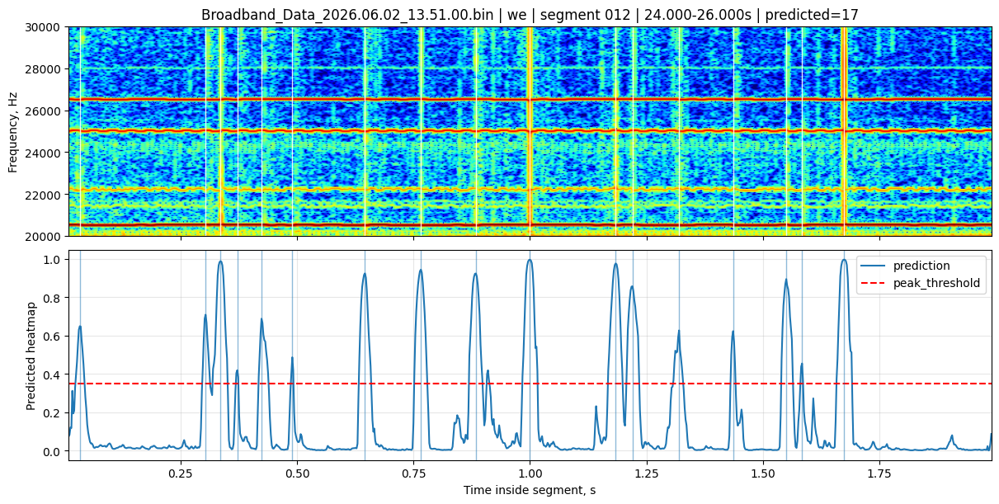

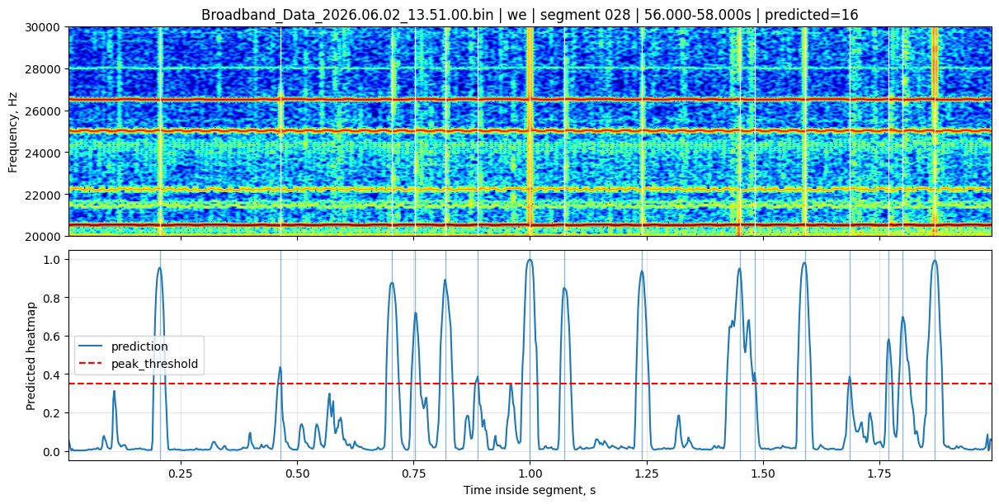

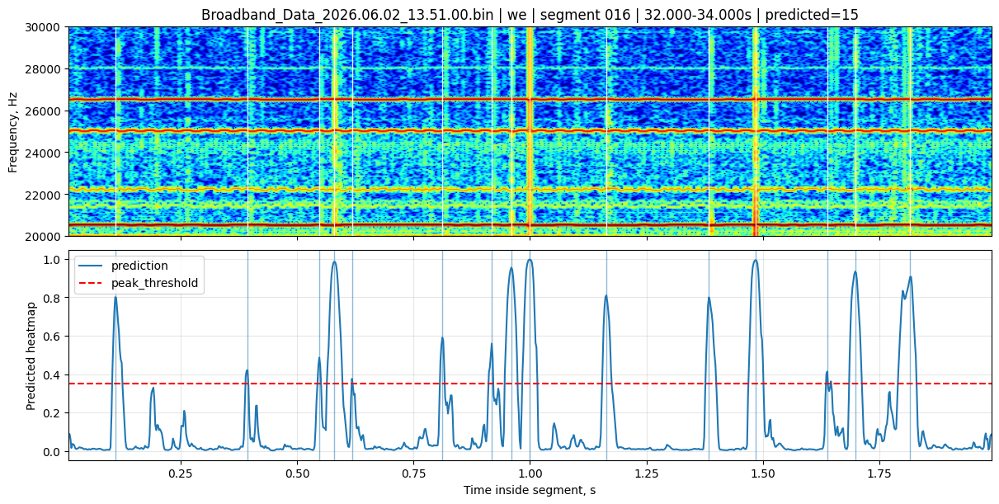

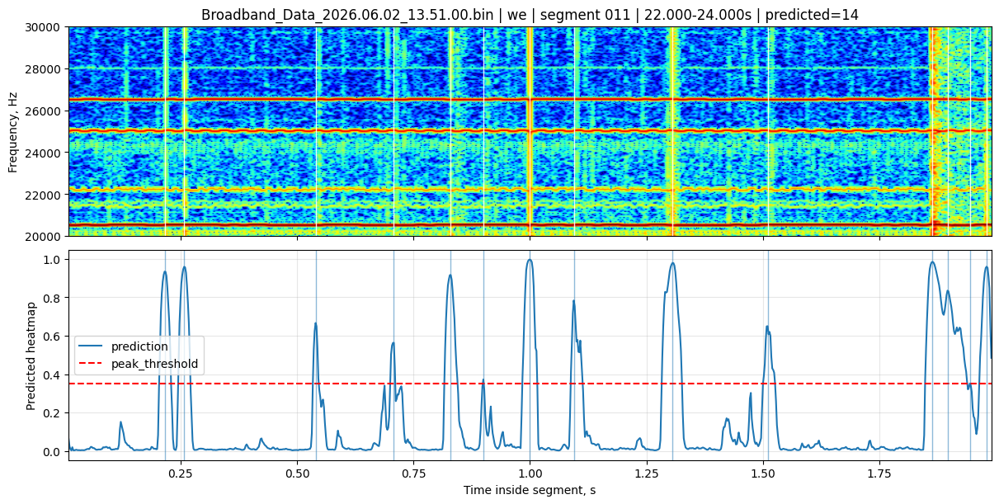

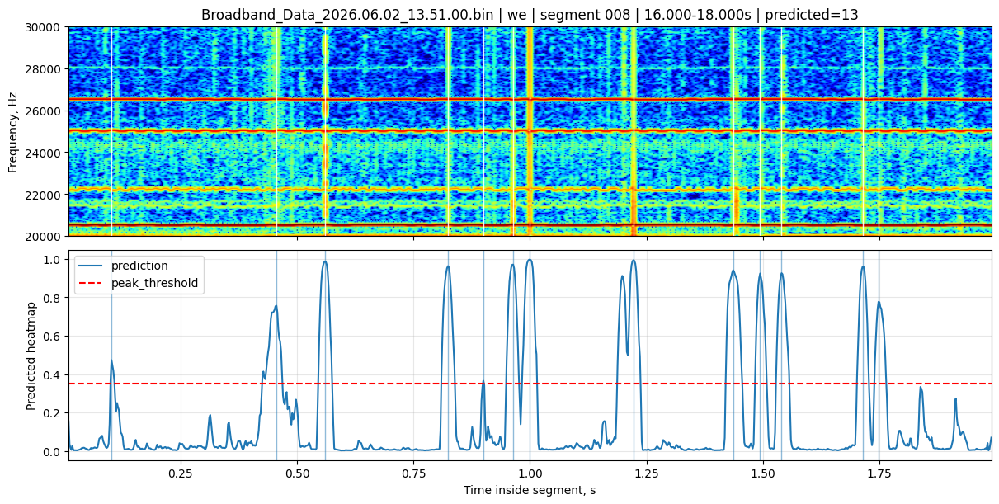

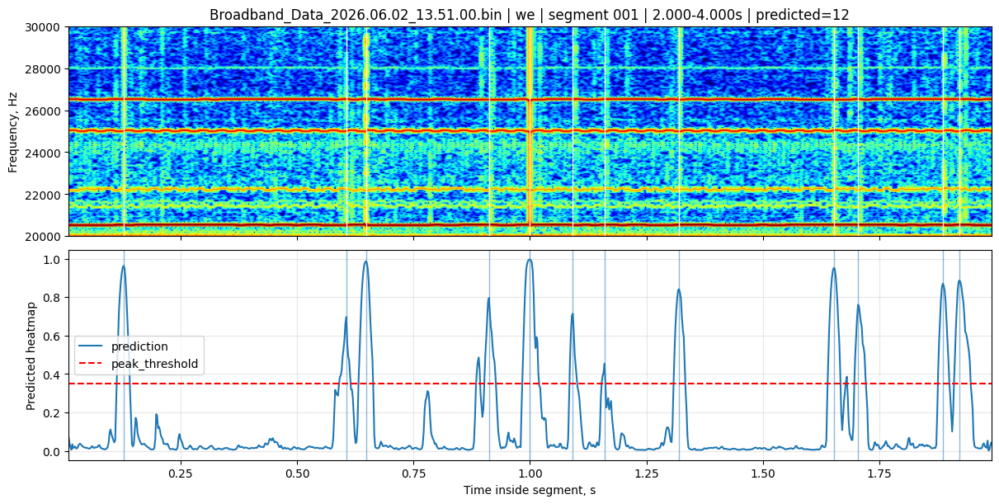

In [31]:
def plot_raw_prediction(channel: str, segment_index: int):
    item = raw_prediction_cache[(channel, int(segment_index))]
    spec_db = item["spec_db"]
    time_axis_s = item["time_axis_s"]
    freq_axis_hz = item["freq_axis_hz"]
    prediction = item["prediction"]
    peaks_inside = item["peaks_inside"]
    start_s = item["segment_start_s"]
    end_s = item["segment_end_s"]

    fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True, constrained_layout=True)
    vmin, vmax = np.percentile(spec_db, [2, 99.8])
    axes[0].imshow(
        spec_db,
        origin="lower",
        aspect="auto",
        extent=(time_axis_s[0], time_axis_s[-1], freq_axis_hz[0], freq_axis_hz[-1]),
        vmin=vmin,
        vmax=vmax,
        cmap="jet",
    )
    for event_time in peaks_inside:
        axes[0].axvline(event_time, color="white", linewidth=1.0, alpha=0.9)
    axes[0].set_title(
        f"{RAW_FILE.name} | {channel} | segment {segment_index:03d} | "
        f"{start_s:.3f}-{end_s:.3f}s | predicted={len(peaks_inside)}"
    )
    axes[0].set_ylabel("Frequency, Hz")

    axes[1].plot(time_axis_s, prediction, label="prediction")
    axes[1].axhline(INFERENCE_PEAK_THRESHOLD, color="red", linestyle="--", label="peak_threshold")
    for event_time in peaks_inside:
        axes[1].axvline(event_time, color="tab:blue", linewidth=1.0, alpha=0.5)
    axes[1].set_xlabel("Time inside segment, s")
    axes[1].set_ylabel("Predicted heatmap")
    axes[1].grid(alpha=0.3)
    axes[1].legend()
    plt.show()

for _, row in raw_predictions_df.sort_values("predicted_event_count", ascending=False).head(6).iterrows():
    plot_raw_prediction(row["channel"], row["segment_index"])
